# **"London's Bike-Sharing Market Research Study"**
## "EDA, Statistical tests and A/B Testing"

##### **Metadata:**
###### **"timestamp"** - timestamp field for grouping the data
###### **"cnt"** - the count of a new bike shares
###### **"t1"** - real temperature in C
###### **"t2"** - temperature in C "feels like"
###### **"hum"** - humidity in percentage
###### **"wind_speed"** - wind speed in km/h
###### **"weather_code"** - category of the weather
###### **"is_holiday"** - boolean field - 1 holiday / 0 non holiday
###### **"is_weekend"** - boolean field - 1 if the day is weekend
###### **"season"** - category field meteorological seasons: 0-spring ; 1-summer; 2-fall; 3-winter.

###### **"weathe_code" category description:**
###### 1 = Clear ; mostly clear but have some values with haze/fog/patches of fog/ fog in vicinity 2 = scattered clouds / few clouds 3 = Broken clouds 4 = Cloudy 7 = Rain/ light Rain shower/ Light rain 10 = rain with thunderstorm 26 = snowfall 94 = Freezing Fog

# **Introduction:**
#### **Context**
- The rise of bike-sharing systems has revolutionized urban mobility, providing a sustainable and eco-friendly transportation alternative. London, a sprawling metropolis with a mix of modernity and heritage, has embraced this mode of transportation, with numerous bike-sharing hubs dotting its landscape. However, for such systems to thrive and meet the needs of the citizens, it's essential to understand the dynamics of usage patterns. This involves not just recognizing the volume of users but also comprehending the external factors that influence their choices.
- Our comprehensive market research study delves deep into London's bike-sharing patterns. By harnessing data-driven insights, we explore how time, weather, day types, and other factors interplay in determining bike-sharing trends. The aim is to provide stakeholders with a holistic understanding of the system's utilization, allowing for enhanced strategic positioning, forecasting, and service optimization.

### **Questions Addressed Through Our Analysis:**
- **Correlation Analysis** - How do different features correlate with bike-sharing patterns?
- **Bike Sharing Trends** - How do bike-sharing habits change yearly, monthly, daily, and hourly?
- **Day Type Influence** - Does the day type (holidays, weekends, working days) impact bike-sharing trends?
- **Seasonal Impact** - How do the four seasons affect bike-sharing habits?
- **Weather's Role** - What role does weather severity play in influencing bike-sharing decisions?
- **Commute vs. Leisure** - How does bike usage vary during typical commute hours versus non-commute hours?
- **Statistical Validity** - What can statistical tests reveal about the significance of our observations?
        

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly as py
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import seaborn as sns
import scipy.stats as stats
import datetime as dt
from scipy.stats import ttest_ind, pearsonr, f_oneway
from scipy.stats import linregress

# Load data
df = pd.read_csv('london_bikes.csv')

df.head()

,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0


In [52]:
# check for null values
df.isnull().mean()*100

timestamp       0.0
cnt             0.0
t1              0.0
t2              0.0
hum             0.0
wind_speed      0.0
weather_code    0.0
is_holiday      0.0
is_weekend      0.0
season          0.0
dtype: float64

In [53]:
# check for duplicates
df.duplicated().mean()*100

0.0

# Feature Engineering

In [54]:
# Converting the timestamp to a datetime object
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extracting the day, month, and year from the timestamp
df['day_of_week'] = df['timestamp'].dt.dayofweek + 1
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year
df['hour'] = df['timestamp'].dt.hour

# Mapping the day_of_week column
days_of_week_map = {
    1: "Monday",
    2: "Tuesday",
    3: "Wednesday",
    4: "Thursday",
    5: "Friday",
    6: "Saturday",
    7: "Sunday"
}
df['day_of_week'] = df['day_of_week'].map(days_of_week_map)

# Mapping the season column
seasons_map = {
    0: "spring",
    1: "summer",
    2: "Autumn",
    3: "winter"
}
df['season_name'] = df['season'].map(seasons_map)

# Mapping the weather_code column
weather_code_map = {
    1: "Clear",
    2: "Few Clouds",
    3: "Broken Clouds",
    4: "Cloudy",
    7: "Light rain",
    10: "rain with thunderstorm",
    26: "snowfall",
    94: "Freezing Fog"
}
df['weather_description'] = df['weather_code'].map(weather_code_map)

# Renaming the specified columns
df.rename(columns={
    "cnt": "count_of_new_bike_shares",
    "t1": "real_temperature_C",
    "t2": "feels_like_temperature_C",
    "hum": "humidity_percentage"
}, inplace=True)

# Mapping month numbers to month names
month_map = {
    1: "January",
    2: "February",
    3: "March",
    4: "April",
    5: "May",
    6: "June",
    7: "July",
    8: "August",
    9: "September",
    10: "October",
    11: "November",
    12: "December"
}
df['month_name'] = df['month'].map(month_map)

In [55]:
# Creating a new feature that combines holidays and weekends
df['day_type'] = np.where(df['is_holiday'] == 1, 'Holiday', 
                          np.where(df['is_weekend'] == 1, 'Weekend', 'Working Day'))
df['day_type'].value_counts()

Working Day    12060
Weekend         4970
Holiday          384
Name: day_type, dtype: int64

In [56]:
# Calculating comfort_index

# Normalizing the temperature and humidity values between 0 and 1
df['normalized_temperature'] = (df['feels_like_temperature_C'] - df['feels_like_temperature_C'].min()) / \
                              (df['feels_like_temperature_C'].max() - df['feels_like_temperature_C'].min())

df['normalized_humidity'] = df['humidity_percentage'] / 100.0

# Normalizing the wind speed values between 0 and 1
df['normalized_wind_speed'] = (df['wind_speed'] - df['wind_speed'].min()) / \
                             (df['wind_speed'].max() - df['wind_speed'].min())

# Adjusting the weights for temperature, humidity, and wind speed
w1 = 0.8  # weight for temperature
w2 = 0.3  # weight for humidity
w3 = 0.1  # weight for wind speed

df['comfort_index'] = w1 * df['normalized_temperature'] + w2 * df['normalized_humidity'] + w3 * df['normalized_wind_speed']

# Dropping the intermediate normalized columns
df.drop(columns=['normalized_temperature', 'normalized_humidity', 'normalized_wind_speed'], inplace=True)

# Updating the weather_severity based on the specified conditions
severe_weather_conditions = ["snowfall", "Freezing Fog", "rain with thunderstorm"]

df['weather_severity'] = df['weather_description'].apply(lambda x: 1 if x in severe_weather_conditions else 0)

# Displaying the top rows of the dataframe with the new features
df.head()

,timestamp,count_of_new_bike_shares,real_temperature_C,feels_like_temperature_C,humidity_percentage,wind_speed,weather_code,is_holiday,is_weekend,season,day_of_week,month,year,hour,season_name,weather_description,month_name,day_type,comfort_index,weather_severity
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,Sunday,1,2015,0,winter,Broken Clouds,January,Weekend,0.449619,0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,Sunday,1,2015,1,winter,Clear,January,Weekend,0.457850,0
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,Sunday,1,2015,2,winter,Clear,January,Weekend,0.459500,0
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,Sunday,1,2015,3,winter,Clear,January,Weekend,0.460000,0
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,Sunday,1,2015,4,winter,Clear,January,Weekend,0.410504,0


In [57]:
# Describe all the columns
df.describe()

,count_of_new_bike_shares,real_temperature_C,feels_like_temperature_C,humidity_percentage,wind_speed,weather_code,is_holiday,is_weekend,season,month,year,hour,comfort_index,weather_severity
count,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000,17414.000000
mean,1143.101642,12.468091,11.520836,72.324954,15.913063,2.722752,0.022051,0.285403,1.492075,6.514643,2015.507810,11.513265,0.595556,0.004249
std,1085.108068,5.571818,6.615145,14.313186,7.894570,2.341163,0.146854,0.451619,1.118911,3.452509,0.508157,6.915893,0.122230,0.065051
min,0.000000,-1.500000,-6.000000,20.500000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2015.000000,0.000000,0.235319,0.000000
25%,257.000000,8.000000,6.000000,63.000000,10.000000,1.000000,0.000000,0.000000,0.000000,4.000000,2015.000000,6.000000,0.494025,0.000000
50%,844.000000,12.500000,12.500000,74.500000,15.000000,2.000000,0.000000,0.000000,1.000000,7.000000,2016.000000,12.000000,0.618511,0.000000
75%,1671.750000,16.000000,16.000000,83.000000,20.500000,3.000000,0.000000,1.000000,2.000000,10.000000,2016.000000,18.000000,0.687858,0.000000
max,7860.000000,34.000000,34.000000,100.000000,56.500000,26.000000,1.000000,1.000000,3.000000,12.000000,2017.000000,23.000000,0.935283,1.000000


# EDA

# **1. Correlation Analysis**

C:\Users\moham\AppData\Local\Temp\ipykernel_1512\338945963.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



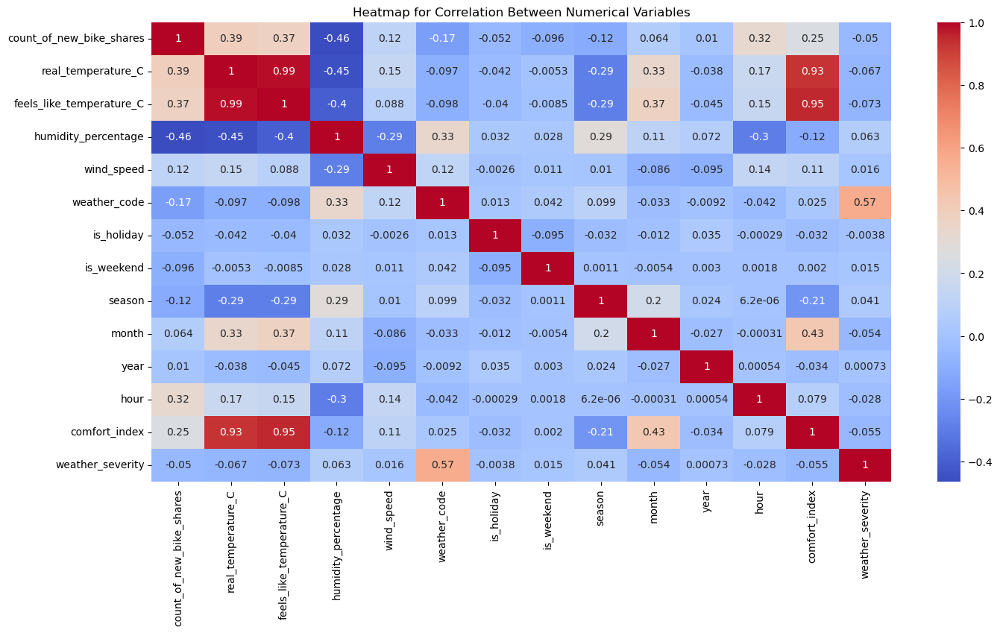

In [58]:
# Calculating the correlation matrix
correlation_matrix = df.corr()

# Heatmap for correlation
plt.figure(figsize=(16, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Heatmap for Correlation Between Numerical Variables')
plt.show()

#### **Correlation Analysis:**

- The correlation matrix showcases the relationships between different numerical variables. From the heatmap, we observed that the real_temperature_C has a significant positive correlation with the number of bike shares. This implies that as the temperature becomes more comfortable, bike shares tend to increase. Other factors like humidity and wind speed also show some degree of correlation with bike shares but not as pronounced as the temperature.
- **Conclusion**: The temperature is a major determinant in the number of bike shares, and understanding its correlation with other factors can aid in anticipating demand.

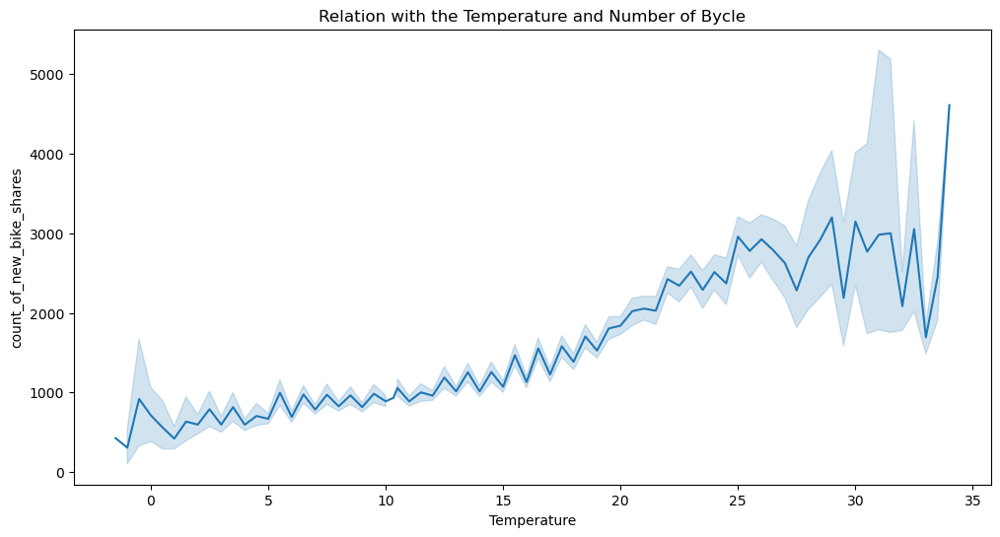

In [59]:
# Relation with the target variable bikes shares and real temperature with lineplot
plt.figure(figsize=(12,6))
sns.lineplot(data=df, x="real_temperature_C", y="count_of_new_bike_shares")
plt.title("Relation with the Temperature and Number of Bycle")
plt.xlabel("Temperature")

plt.show()

##### **Relation with the Temperature and Number of Bicycle:**

- As temperatures become more comfortable (neither too cold nor too hot), there's likely an increase in the number of bike shares. This is because people prefer to ride bikes in comfortable weather.
- Extremely high or low temperatures might lead to a decrease in the number of bike shares. Very cold weather can deter riders due to the cold, while very hot weather can be uncomfortable or even dangerous for strenuous activities like biking.
- There might be a sweet spot or range of temperatures where bike sharing is most popular, representing the most comfortable outdoor temperatures for biking.

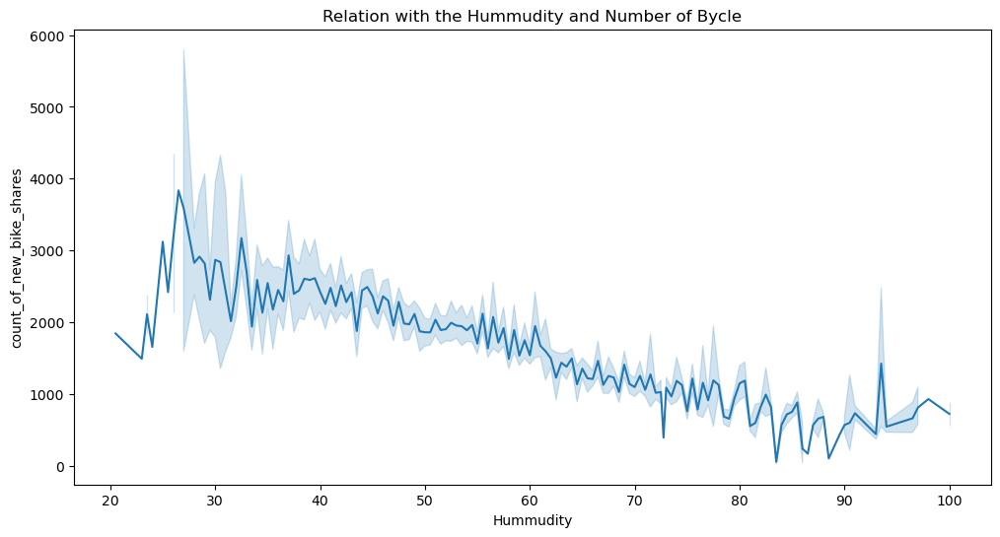

In [60]:
# Relation with the target variable bikes shares and real temperature with lineplot
plt.figure(figsize=(12,6))
sns.lineplot(data=df, x="humidity_percentage", y="count_of_new_bike_shares")
plt.title("Relation with the Hummudity and Number of Bycle")
plt.xlabel("Hummudity")

plt.show()

##### **Relation with the Humidity and Number of Bicycle:**

- High humidity can be uncomfortable for outdoor activities, so there might be a decrease in the number of bike shares as humidity increases.
- Very low humidity, on the other hand, can also be uncomfortable and can cause dehydration faster during physical activities. Therefore, there might be fewer bike shares in extremely dry conditions.
- Similar to temperature, there might be a comfortable range of humidity levels where bike sharing is more popular.

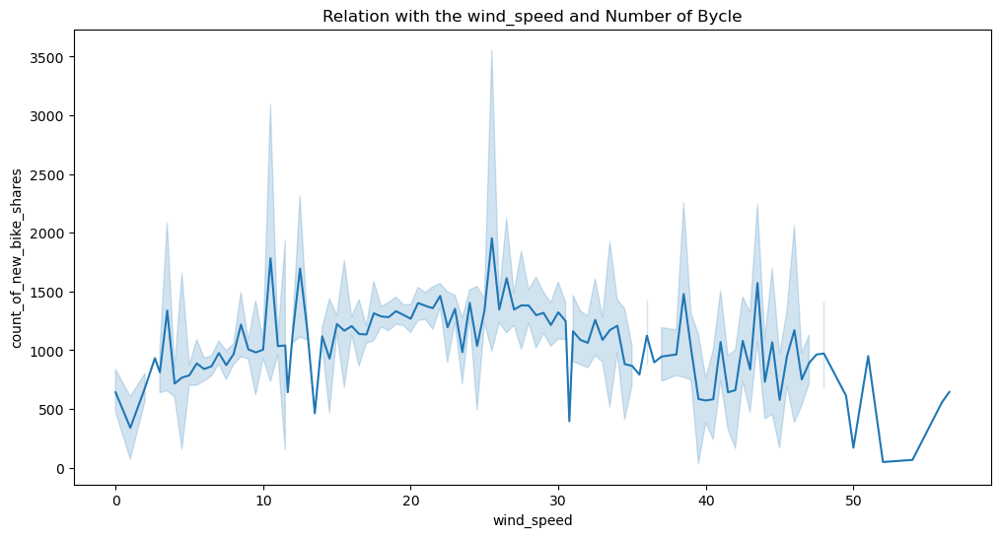

In [61]:
# Relation with the target variable bikes shares and real temperature with lineplot
plt.figure(figsize=(12,6))
sns.lineplot(data=df, x="wind_speed", y="count_of_new_bike_shares")
plt.title("Relation with the wind_speed and Number of Bycle")
plt.xlabel("wind_speed")

plt.show()

In [62]:
# Create the scatter plot
fig = px.scatter(df, x="wind_speed", y="count_of_new_bike_shares",color="wind_speed")

# Show the plot
fig.show()

##### Bike shares generally remain consistent with varying wind speeds up to about 30-35 units of wind speed.
- Beyond this point (around 35 units of wind speed), there seems to be a decrease in the number of bike shares, and fewer data points are available, indicating that such high wind speeds are less common.
- Thus, it can be inferred that the bike shares start to decrease when the wind speed exceeds approximately 35 units.

##### **1. Correlation Analysis:**
- The correlation matrix showcases the relationships between different numerical variables. From the heatmap, we observed that the real_temperature_C has a significant positive correlation with the number of bike shares. This implies that as the temperature becomes more comfortable, bike shares tend to increase. Other factors like humidity and wind speed also show some degree of correlation with bike shares but not as pronounced as the temperature.
- **Conclusion:** The temperature is a major determinant in the number of bike shares, and understanding its correlation with other factors can aid in anticipating demand.
##### ---------------------------------------------------------------------------------------------------------------------------------

# **2. Bike Sharing Trends: Yearly, Monthly, Daily, and Hourly**

In [63]:
# Grouping data by year and average the count of bike shares
yearly_data_grouped = df.groupby('year')['count_of_new_bike_shares'].mean().reset_index()

# Creating a bar plot for Yearly Bike Consumption with color based on year
yearly_plot = px.bar(yearly_data_grouped, x='year', y='count_of_new_bike_shares', title='Yearly Bike Average Consumption', color='count_of_new_bike_shares')

# Show the plot
yearly_plot.show()

In [64]:
# Grouping data by month and summing the count of bike shares
monthly_data_grouped = df.groupby('month')['count_of_new_bike_shares'].sum()

# Creating a bar plot for Monthly Bike Consumption with color based on month number
bar_monthly = px.bar(monthly_data_grouped, title='Monthly Bike Consumption', color=monthly_data_grouped.index)
bar_monthly.update_xaxes(ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], tickvals=list(month_map.keys()))

# Extracting the y-values (Bike shares) for each month
bike_shares_by_month = monthly_data_grouped.values

# Plotting the bar plot
bar_monthly.show()

- **January and February** have roughly similar bike shares, indicating a steady demand at the beginning of the year.
- Starting **March**, there's an upward trend peaking in **July**. This suggests that as the weather improves from spring to summer, bike-sharing becomes increasingly popular.
- **Post-July**, there's a slight decline in **August** followed by a more pronounced decrease in **September, October, and November**. This could be attributed to the onset of autumn and early winter, where the weather might not be as conducive for biking.
- **December** sees the lowest bike shares after **January and February**, which might be due to colder winter conditions and holiday seasons where people might not commute as much.

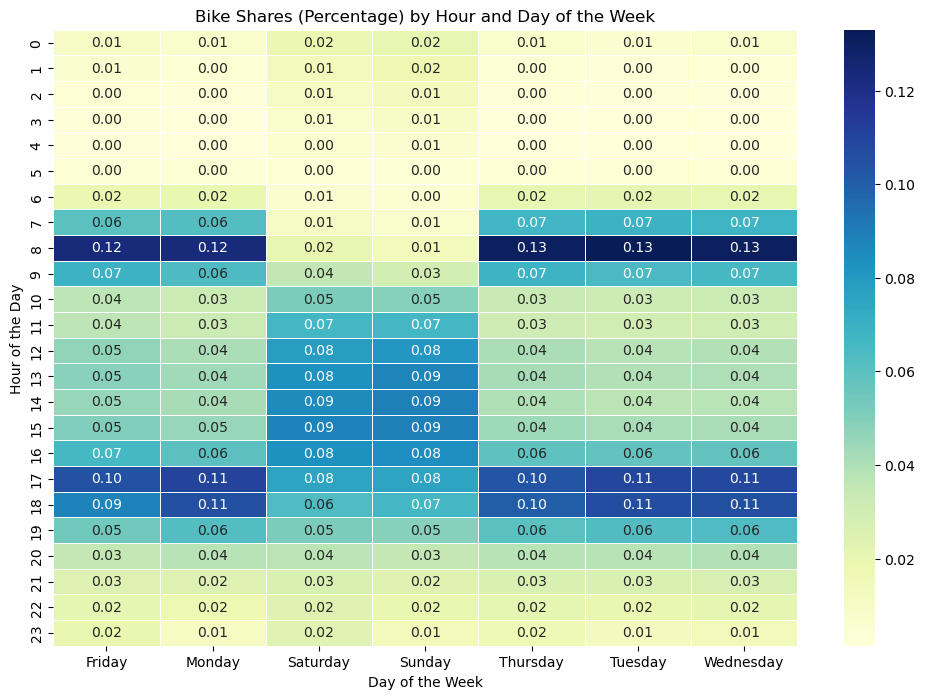

In [65]:
# Calculating the total shares for each day
total_shares_per_day = df.groupby(['day_of_week'])['count_of_new_bike_shares'].sum()

# Grouping by hour and day_of_week to calculate the average count of bike shares
avg_bike_shares_hour_day = df.groupby(['hour', 'day_of_week'])['count_of_new_bike_shares'].mean().unstack()

# Calculating the average shares for each hour as a percentage of the total day's shares
percent_bike_shares_hour_day = avg_bike_shares_hour_day.divide(total_shares_per_day, axis=1) * 100

# Formatting the values correctly for annotation
formatted_percentages = percent_bike_shares_hour_day.applymap(lambda x: f"{x:.0f}%")

# Heatmap for bike shares (as a percentage) by hour and day of the week
plt.figure(figsize=(12, 8))
sns.heatmap(percent_bike_shares_hour_day, cmap='YlGnBu', annot=True, fmt=".2f", linewidths=.5)
plt.title('Bike Shares (Percentage) by Hour and Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Hour of the Day')
plt.show()


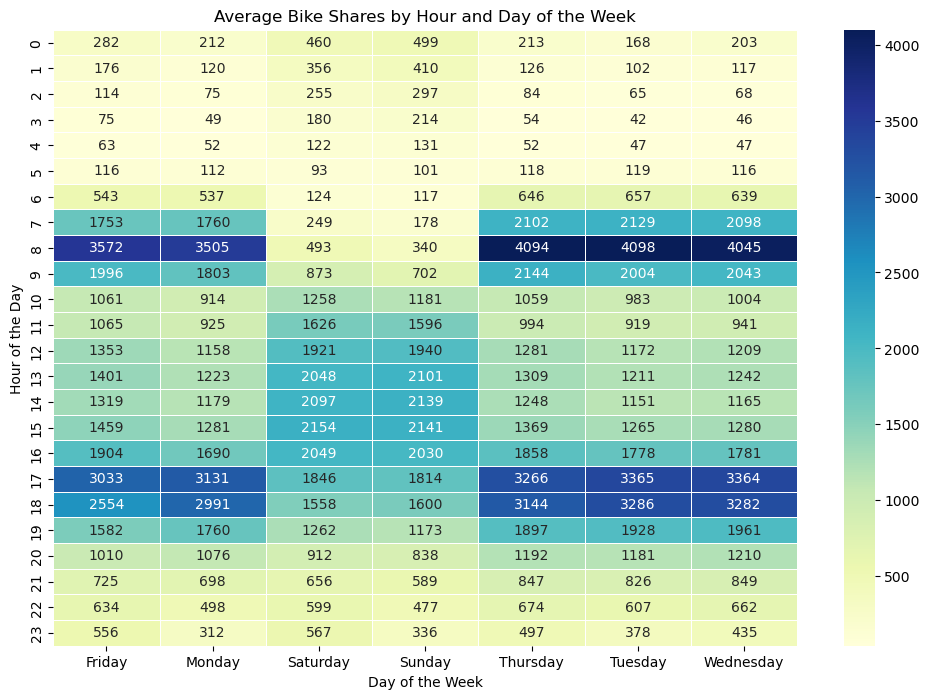

In [66]:
# Heatmap for average bike shares by hour and day of the week
plt.figure(figsize=(12, 8))
sns.heatmap(avg_bike_shares_hour_day, cmap='YlGnBu', annot=True, fmt=".0f", linewidths=.5)
plt.title('Average Bike Shares by Hour and Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Hour of the Day')
plt.show()

- The heatmap provides insights into hourly and daily patterns:

- Weekdays **(Monday to Friday)** show two prominent peaks: one in the morning around 8 AM and another in the evening around 5-6 PM, likely corresponding to commute hours.
- Weekends **(Saturday and Sunday)** don't have these pronounced peaks, and bike usage is more spread out during the day, peaking in the early afternoon.

In [67]:
# Calculating average bike shares for each day of the week
avg_bike_shares_day = df.groupby('day_of_week')['count_of_new_bike_shares'].sum().reset_index()

# Sorting days of the week in order
days_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
avg_bike_shares_day['day_of_week'] = pd.Categorical(avg_bike_shares_day['day_of_week'], categories=days_order, ordered=True)
avg_bike_shares_day = avg_bike_shares_day.sort_values('day_of_week')

# 6. Bar Plot for average bike shares by day of the week
bar_day = px.bar(avg_bike_shares_day, x='day_of_week', y='count_of_new_bike_shares', color= 'count_of_new_bike_shares', title='Average Bike Shares by Day of the Week')
bar_day.show()

- The bar plot provides insights into the average bike shares for each day of the week:

- Bike shares are highest on weekdays, with a peak around Wednesday and Thursday. This suggests that bikes are frequently used for weekday commutes or daily routines.
- There is a noticeable drop in bike shares on weekends (Saturday and Sunday). This might be due to the lack of work-related commutes or different weekend activity patterns.

In [68]:
# First, we need to compute avg_bike_shares_per_hour
avg_bike_shares_per_hour = df.groupby(['hour', 'season_name'])['count_of_new_bike_shares'].mean().reset_index()

line_hour_season = px.line(avg_bike_shares_per_hour, x='hour', y='count_of_new_bike_shares', color='season_name', title='Average Bike Shares per Hour by Season', markers=True)
line_hour_season.update_xaxes(tickvals=list(range(0, 24)))
line_hour_season.show()

- The line chart displays the average count of new bike shares for each hour, differentiated by season:

- There's a clear pattern of two peaks in bike shares: one in the morning (around 8 AM) and another in the evening (around 5 and 6 PM). This can be associated with commute hours.
- Summer and spring and Autumn have higher bike shares compared to winter, likely due to favorable weather conditions during these seasons.

In [69]:
# Grouping by hour and day_type to calculate the average count of bike shares
weekends = px.scatter(df, x="hour", y="count_of_new_bike_shares", color='day_type', title='Average Bike Shares per Hour by Day Type')
weekends.update_xaxes(tickvals=list(range(0, 24)))
weekends.show()

In [70]:
# Grouping by hour and is_holiday to calculate the average count of bike shares
avg_bike_shares_hour_holiday = df.groupby(['hour', 'is_weekend'])['count_of_new_bike_shares'].mean().reset_index()

# 7. Line plot comparing average bike shares per hour for holidays and non-holidays
line_hour_holiday = px.line(avg_bike_shares_hour_holiday, x='hour', y='count_of_new_bike_shares', color='is_weekend', title='Hourly Bike Shares: 1= Weekends vs. 0= Weekdays', markers=True)
line_hour_holiday.update_xaxes(tickvals=list(range(0, 24)))

line_hour_holiday.show()

In [71]:
# Grouping by hour and is_holiday to calculate the average count of bike shares
avg_bike_shares_hour_holiday = df.groupby(['hour', 'is_holiday'])['count_of_new_bike_shares'].mean().reset_index()

# 7. Line plot comparing average bike shares per hour for holidays and non-holidays
line_hour_holiday = px.line(avg_bike_shares_hour_holiday, x='hour', y='count_of_new_bike_shares', color='is_holiday', title='Hourly Bike Shares: 1= Holidays vs. 0= Non-Holidays', markers=True)
line_hour_holiday.update_xaxes(tickvals=list(range(0, 24)))

line_hour_holiday.show()

- The line plot provides insights into hourly bike shares comparing holidays and non-holidays:

- For non-holidays, the dual peak pattern (morning and evening commute hours) is evident, aligning with what we observed earlier.
- On holidays, there isn't a pronounced peak during typical commute hours. Instead, bike shares gradually increase throughout the morning and peak in the early afternoon. This suggests more recreational or leisurely use of bikes on holidays as opposed to commute-driven use on regular days.

- **2. Bike Sharing Trends: Yearly, Monthly, Daily, and Hourly:**

- There's a yearly rise in bike consumption, indicating growing popularity or perhaps an expanding service. Monthly patterns reveal higher bike shares during summer, especially in July, and lower shares during winter months like December. The hourly pattern demonstrates typical commute behaviors with peaks during morning and evening rush hours.
- **Conclusion:** Bike-sharing patterns are heavily influenced by the time of year, month, and day. Recognizing these patterns can help in optimizing resources and services
##### ----------------------------------------------------------------------------------------------------------------------------------

# 3. Bike Shares Based on Day Type

In [72]:
# 1. Pie chart for is_holiday
pie_day_type = px.pie(df, values='count_of_new_bike_shares', names='day_type', title='Bike Shares based on Holidays, Weekends, and Working Days')

# visualization
pie_day_type.show()

- **Bike Shares based on Holidays, Weekends, and Working Days (pie_day_type):**

- This chart shows the number of bike shares for holidays, weekends, and working days.
- If working days occupy a significant portion of the pie chart, it suggests bikes are primarily used for daily commuting.
- A smaller slice for holidays might indicate reduced biking due to leisure activities or alternative modes of transportation for longer trips.

In [73]:
# 8. Box plot for bike shares by Weekend vs. Non-Weekend
box_Weekend = px.box(df, x='is_holiday', y='count_of_new_bike_shares', color='is_holiday', title='Box Plot: Is Holiday vs. Count of New Bike Shares')
box_Weekend.update_xaxes(ticktext=['Non-Holiday', 'Holiday'], tickvals=[0, 1])

box_Weekend.show()

- The boxplot above represents the distribution of bike shares on holidays versus non-holidays. It's evident that on average, there are fewer bike shares on holidays compared to regular days. The median for non-holidays is higher, and the interquartile range is wider, indicating more variability in bike shares on regular days.

In [74]:
# Bar plot for bike shares during holidays
bar_holidays = px.bar(df.groupby('is_holiday').sum().reset_index(), x='is_holiday', y='count_of_new_bike_shares',color='is_holiday', 
                      title='Total Bike Shares: Non-Holidays vs. Holidays', 
                      labels={'count_of_new_bike_shares': 'Total Count of Bike Shares'},
                      category_orders={"is_holiday": [0, 1]})

# Customize the x-axis labels
bar_holidays.update_xaxes(ticktext=['Non-Holidays', 'Holiday'], tickvals=[0, 1])

bar_holidays.show()

C:\Users\moham\AppData\Local\Temp\ipykernel_1512\3849525121.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



- **Holidays vs. Non-Holidays Bar Plot:** This Bar Plot would compare bike shares on holidays and non-holidays. A significant difference could indicate the impact of holidays on bike usage. For instance, if there's a noticeable dip in bike shares on holidays, it might mean that people either don't commute or use bikes for different purposes on those days.

In [75]:
# 8. Box plot for bike shares by Weekend vs. Non-Weekend
box_Weekend = px.box(df, x='is_weekend', y='count_of_new_bike_shares', color='is_weekend', title='Box Plot: Is Weekend vs. Count of New Bike Shares')
box_Weekend.update_xaxes(ticktext=['Non-Weekend', 'Weekend'], tickvals=[0, 1])

box_Weekend.show()

- The above boxplot displays the bike shares on weekdays versus weekends. From the plot, we can infer that the median bike share count is slightly higher on weekends than on weekdays. The interquartile range for weekends is also wider, indicating more variability in bike shares on weekends.

In [76]:
# Bar plot for bike shares during weekends
bar_weekend = px.bar(df.groupby('is_weekend').sum().reset_index(), x='is_weekend', y='count_of_new_bike_shares',color='is_weekend', 
                     title='Total Bike Shares: Weekdays vs. Weekends', 
                     labels={'count_of_new_bike_shares': 'Total Count of Bike Shares'},
                     category_orders={"is_weekend": [0, 1]})
                     
# Customize the x-axis labels
bar_weekend.update_xaxes(ticktext=['Non-Weekend', 'Weekend'], tickvals=[0, 1])

bar_weekend.show()

C:\Users\moham\AppData\Local\Temp\ipykernel_1512\4177194298.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



- **Weekends vs. Weekdays Bar Plot:** This Bar Plot would show the distribution of bike shares on weekends compared to weekdays. A noticeable difference in distribution would indicate that people use bikes differently during weekends compared to weekdays. For instance, higher counts on weekends might suggest more recreational use, while higher counts on weekdays might indicate commuting.

- **Bike Shares Based on Day Type:**
- Analysis shows that bike shares vary based on whether it's a holiday, weekend, or working day. Typically, bike shares are lower on holidays and weekends as opposed to regular weekdays.
- **Conclusion:** Understanding daily variations, especially during holidays and weekends, can help in making informed decisions about bike placements and offers to boost usage during these days.
#### ---------------------------------------------------------------------------------------------------------------------------------------

# 4. Commute hours and Bike Sharing Distribution.
##### to check bikes share in commute hours and non commute hours.

In [77]:
# Creating the 'commute_hours' feature, Commute Hours (1 for 7-8-9 AM & 5-6-7 PM, 0 otherwise)
df['commute_hours'] = df['hour'].apply(lambda x: 1 if x in [7, 8, 9, 17, 18, 19] else 0)

In [78]:
# 8. Box plot for bike shares by commute_hours on non-holiday days
df_non_holidays = df[df['is_holiday'] == 0]
box_commute = px.box(df_non_holidays, x='commute_hours', y='count_of_new_bike_shares', color='commute_hours', title='Box Plot: Commute Hours vs. Count of New Bike Shares (Non-Holidays)')
box_commute.update_xaxes(ticktext=['Non-Commute Hours', 'Commute Hours'], tickvals=[0, 1])

box_commute.show()

- The box plot displays the distribution of bike shares for commute and non-commute hours on non-holiday days:

- **Non-Commute Hours (0):** The median bike share count during non-commute hours on non-holiday days is lower than during commute hours. The interquartile range (IQR) indicates variability in bike shares during these hours, and there are several outliers, particularly on the higher end.

- **Commute Hours (1)**: On non-holiday days during commute hours (7-9 AM & 5-7 PM), the median bike share count is significantly higher. The IQR is more compact, suggesting less variability in bike shares during these hours compared to non-commute hours.
##### ----------------------------------------------------------------------------------------------------------------------------------

# **5. Seasonal and Weather Severity Analysis**

In [79]:
# Group by month and aggregate based on the average comfort index and sum of bike shares
monthly_data_comfort = df.groupby('month').agg({
    'comfort_index': 'mean',
    'count_of_new_bike_shares': 'sum'
}).reset_index()

# Create a bar plot for Monthly Bike Consumption vs. Comfort Index
bar_monthly_comfort = px.bar(monthly_data_comfort, x='month', y='count_of_new_bike_shares',color='count_of_new_bike_shares',
                             title='Monthly Bike Consumption vs. Comfort Index',
                             hover_data=['comfort_index'])

# Update x-axis to have month names
bar_monthly_comfort.update_xaxes(ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
                                tickvals=list(month_map.keys()))


- **Insight:**
- By analyzing the Monthly Bike Consumption in conjunction with the Comfort Index, we can ascertain the influence of environmental comfort on bike-sharing patterns. For instance:

- If months with a higher comfort index also show higher bike shares, this suggests that users prefer to rent bikes when environmental conditions are more favorable.
- Conversely, if some months have high bike shares despite a lower comfort index, other factors (like holidays, events, promotions, etc.) might be influencing bike-sharing trends during those months.
- This visualization aids in understanding the correlation between environmental comfort and bike-sharing behavior, allowing stakeholders to make informed decisions about infrastructure, promotions, and other initiatives.

In [80]:
# Adjust color for Autumn season to be more transparent
custom_colors = {
    "spring": "rgb(237, 74, 74)",
    "summer": "rgb(100, 184, 88)",
    "Autumn": "rgba(255,165,0,0.3)",
    "winter": "rgb(109, 158, 222)"
}

# Scatter plot with custom colors and an overall trendline for all seasons
scatter_season_with_overall_regression = px.scatter(df, x='comfort_index', y='count_of_new_bike_shares', color='season_name', 
                                                   color_discrete_map=custom_colors,
                                                   title='Scatter Plot: Comfort Index vs. Count of New Bike Shares')

# Move the trend line to the front
scatter_season_with_overall_regression.data = (scatter_season_with_overall_regression.data[-1],) + scatter_season_with_overall_regression.data[:-1]

scatter_season_with_overall_regression

- The scatter plot displays the relationship between the comfort_index and the count_of_new_bike_shares. As the comfort index increases, we can observe an increase in the number of bike shares, suggesting that people tend to use bikes more when the weather is comfortable.

- The Comfort Index, derived from temperature, humidity and wind speed, plays a pivotal role in influencing bike-sharing behaviors. When the Comfort Index is high, implying optimal temperature and humidity levels, there's a noticeable surge in bike rentals. Conversely, a lower Comfort Index, indicating either too hot, too cold, or too humid conditions, leads to a reduced demand. For bike-sharing businesses, understanding this index can be instrumental in forecasting demand, optimizing inventory, and enhancing customer experiences. By aligning promotional activities, maintenance schedules, and inventory planning with the Comfort Index predictions, businesses can maximize profitability and customer satisfaction.

In [81]:
# Grouping the data by 'season_name' and 'day_type' to check bike shares for each combination
bike_shares_by_day_type_season = df.groupby(['season_name', 'day_type'])['count_of_new_bike_shares'].sum().reset_index()

# Sorting the dataframe by 'count_of_new_bike_shares' in descending order
bike_shares_by_day_type_season = bike_shares_by_day_type_season.sort_values(by='count_of_new_bike_shares', ascending=False)

## Creating a bar plot using plotly to check bike shares for each combination of season and day_type
bar_bike_shares_day_type_season = px.bar(bike_shares_by_day_type_season, 
                                         x='season_name', 
                                         y='count_of_new_bike_shares', 
                                         color='day_type', 
                                         title='Bike Shares by Day Type in Each Season',
                                         barmode='group')

bar_bike_shares_day_type_season.show() 

In [82]:
# Calculate the overall total bike shares
overall_total_bike_shares = df['count_of_new_bike_shares'].sum()

# Calculate the percentage of bike shares for each day_type within each season based on the overall total
bike_shares_by_day_type_season['percentage'] = bike_shares_by_day_type_season['count_of_new_bike_shares'].apply(lambda x: (x / overall_total_bike_shares) * 100)

# Format the count_of_new_bike_shares column to include commas for better readability
bike_shares_by_day_type_season['count_of_new_bike_shares'] = bike_shares_by_day_type_season['count_of_new_bike_shares'].apply(lambda x: "{:,}".format(x))

# Format the percentage column to include % with one decimal number
bike_shares_by_day_type_season['percentage'] = bike_shares_by_day_type_season['percentage'].apply(lambda x: f"{x:.1f}%")

# Reordering the table
bike_shares_by_day_type_season = bike_shares_by_day_type_season.sort_values(by="percentage", ascending=False, key=lambda x: x.str[:-1].astype(float)).reset_index(drop=True)

bike_shares_by_day_type_season

,season_name,day_type,count_of_new_bike_shares,percentage
0,summer,Working Day,"4,653,041",23.4%
1,Autumn,Working Day,"3,889,779",19.5%
2,spring,Working Day,"3,454,857",17.4%
3,winter,Working Day,"2,755,041",13.8%
4,summer,Weekend,"1,727,753",8.7%
5,spring,Weekend,"1,223,768",6.1%
6,Autumn,Weekend,"1,183,261",5.9%
7,winter,Weekend,"722,974",3.6%
8,spring,Holiday,"171,611",0.9%
9,winter,Holiday,"80,072",0.4%


- Bike-sharing in London peaks during warmer months, especially on working days, with summer leading at 32.3% of shares; however, shares significantly drop during holidays, indicating a reliance on bikes mainly for daily work commutes and routine activities.

##### **Insights from Bike Shares by Day Type and Season:**
- Across all seasons, working days consistently have the highest bike shares. This suggests that a significant portion of bike users in London rely on bikes for their daily commutes to work or other routine activities.
- Weekends, while having a noticeable amount of bike shares, are significantly less than working days. Holidays have the least shares, indicating that fewer people use bikes during public holidays.

In [83]:
# 13. Box plot for bike shares by season
box_season = px.box(df, x='season_name', y='count_of_new_bike_shares', color = 'season_name', title='Distribution of Bike Shares by Season', color_discrete_map=custom_colors)

box_season.show()

**The boxplot above showcases bike shares across different seasons. From the visualization, we can infer:**
- **Spring** sees a moderate number of bike shares, with a median that's slightly lower than other seasons.
- **Summer** exhibits the highest demand for bikes, with the highest median and a wide interquartile range. This suggests that the warm and pleasant weather of summer encourages more people to use bikes.
- **Autumn** has a median bike share count slightly less than summer but higher than winter and spring. The range, however, is quite compressed, indicating less variability in bike shares during this season.
- **Winter** has the lowest median bike share count among all seasons. This can be attributed to colder temperatures and potentially adverse weather conditions that might deter people from biking.

In [84]:
# 2. Pie chart for season
pie_season = px.pie(df, values='count_of_new_bike_shares', names='season_name', title='Bike Shares based on Seasons', color= 'season_name', color_discrete_map=custom_colors)

pie_season.show()

In [85]:
# 13. Box plot for bike shares by season
box_season = px.histogram(df, x='season_name', y='count_of_new_bike_shares', color='season_name', color_discrete_map=custom_colors, title='Distribution of Bike Shares by Season')
box_season.update_xaxes(categoryorder='total descending')

box_season.show()

- **Seasonal Variability:** The box plot for bike shares by season shows differences in the distribution of bike shares across the seasons, with summer likely having the highest median and broader distribution, indicating its popularity for bike sharing.

- **Dominance of Summer:** The pie chart reinforces that summer is the predominant season for bike sharing, occupying the largest portion of the pie, signifying its dominance in overall bike shares.

- **Histogram Observations:** The histogram, arranged in descending order, provides a clear visual representation of the total counts of bike shares per season. It's evident that summer and spring have higher frequencies, suggesting they are the preferred seasons for bike-sharing, followed by autumn and winter.

In [86]:
# 11. Box plot for weather_severity against count_of_new_bike_shares
box_weather_severity = px.box(df, x='weather_severity', y='count_of_new_bike_shares', color='weather_severity', title='Weather Severity vs. Count of New Bike Shares')
box_weather_severity.update_xaxes(ticktext=['Non Severe', 'Severe'], tickvals=[0, 1])

box_weather_severity.show()

- The above boxplot depicts bike shares on days with severe weather compared to days with non-severe weather. As one might expect, the median bike share count is lower on days with severe weather. The distribution is also more compressed for severe weather days, indicating less variability in bike shares on such days.



In [87]:
# Create weather_colors
weather_colors = {
    "Clear": "rgb(58, 200, 225)",  # Light blue for clear sky
    "Few Clouds": "rgb(174, 214, 241)",  # Slightly darker blue for few clouds
    "Broken Clouds": "rgb(211, 84, 0)",  # Orange for broken clouds
    "Cloudy": "rgb(133, 146, 158)",  # Grey for cloudy
    "Light rain": "rgb(41, 128, 185)",  # Dark blue for light rain
    "rain with thunderstorm": "rgb(192, 57, 43)",  # Red for thunderstorm
    "snowfall": "rgb(55, 80, 100)",  # White for snowfall
    "Freezing Fog": "rgb(52, 73, 94)"  # Dark grey for freezing fog
}

# 12. Bar and Box plots for the frequency of weather conditions and the effect on bike shares
bar_weather_freq = px.histogram(df, x='weather_description', color='weather_description', color_discrete_map=weather_colors, title='Frequency of Weather Conditions')
bar_weather_freq = bar_weather_freq.update_xaxes(categoryorder='total descending')

box_weather_effect = px.box(df, x='weather_description', y='count_of_new_bike_shares', color='weather_description', color_discrete_map=weather_colors, title='Bike Shares Distribution by Weather Condition')
box_weather_effect = box_weather_effect.update_xaxes(categoryorder='total descending')

# 4. Pie chart for weather_description
pie_weather_description = px.pie(df, values='count_of_new_bike_shares', names='weather_description', title='Bike Shares based on Weather Description', color= 'weather_description', color_discrete_map=weather_colors)

box_weather_effect.show(),pie_weather_description.show() , bar_weather_freq.show()

(None, None, None)

- The two plots provide insights into the frequency of different weather conditions and their impact on bike sharing:
##### **Frequency of Weather Conditions (Top Plot):**
- The most frequent weather condition in the dataset is "Clear", followed by "Few Clouds" and "Broken Clouds". These are generally favorable conditions for outdoor activities like biking.
- Severe weather conditions such as "Freezing Fog", "rain with thunderstorm", and "snowfall" are less frequent.
##### **Bike Shares Distribution by Weather Condition (Bottom Plot):**
- The median number of bike shares is highest for "Clear" and "Few Clouds" weather conditions. This aligns with the intuition that people prefer biking when the weather is clear and favorable.
- "Cloudy" and "Broken Clouds" also have a considerable number of bike shares, albeit with a broader distribution, indicating variability in bike sharing.
- Severe weather conditions, like "rain with thunderstorm", "snowfall", and "Freezing Fog", have a lower median bike share count. This suggests that people tend to avoid biking during such conditions.
- The presence of outliers in the box plots for some weather conditions indicates occasional spikes in bike shares, even during less favorable conditions. This could be due to other factors, like promotions, events, or specific commuter patterns.

##### **Key Takeaways:**

- Favorable weather conditions, such as clear skies, generally lead to a higher number of bike shares.
- Severe weather conditions are associated with decreased bike sharing activity.
- Other external factors might lead to occasional spikes in bike shares even during less favorable weather conditions.

#### **5. Seasonal and Weather Severity Analysis:**

- Bike shares vary significantly with the seasons. Summer and spring witness higher bike shares compared to autumn and winter. Also, bike shares are highest on clear days and reduce significantly during severe weather conditions like snowfall and freezing fog.
- **Conclusion:** Seasonal and weather variations play a pivotal role in bike-sharing trends. Preparing for these fluctuations by adjusting the number of available bikes or promoting usage during less popular times can be beneficial.
#### -------------------------------------------------------------------------------------------------------------------------------------

# **6. Statistical Analysis**
# ANOVA test, T-test and Pearson's Correlation
#### We will now run the ANOVA test for the count_of_new_bike_shares across different seasons.

##### We will Define a fuction to yield result on the basis of given significance value - 0.05.

In [88]:
# function to return the hypothesis result directly
def H_Test_Result(p_value):
    significance_level = 0.05
    if p_value <= significance_level: 
        return 'Reject NULL HYPOTHESIS'
    else: 
        return 'Fail to Reject NULL HYPOTHESIS'

In [89]:
# Running the tests
f_value, p_value_season = stats.f_oneway(df['count_of_new_bike_shares'][df['season_name'] == 'spring'],
                                         df['count_of_new_bike_shares'][df['season_name'] == 'summer'],
                                         df['count_of_new_bike_shares'][df['season_name'] == 'Autumn'],
                                         df['count_of_new_bike_shares'][df['season_name'] == 'winter'])

correlation_coefficient, p_value_comfort = pearsonr(df["comfort_index"], df["count_of_new_bike_shares"])

t_stat_holiday, p_value_holiday = ttest_ind(df["count_of_new_bike_shares"][df["is_holiday"] == 1], df["count_of_new_bike_shares"][df["is_holiday"] == 0])

t_stat_weekend, p_value_weekend = ttest_ind(df["count_of_new_bike_shares"][df["is_weekend"] == 1], df["count_of_new_bike_shares"][df["is_weekend"] == 0])

# Formatting the hypothesis test results as desired
hypothesis_test_results = {
    "Comfort Index vs. Bike Shares": (f"P-value: {p_value_comfort*100:.2f}%", H_Test_Result(p_value_comfort)),
    "Holiday vs. Bike Shares": (f"P-value: {p_value_holiday*100:.2f}%", H_Test_Result(p_value_holiday)),
    "Weekend vs. Bike Shares": (f"P-value: {p_value_weekend*100:.2f}%", H_Test_Result(p_value_weekend)),
    "Season vs. Bike Shares": (f"P-value: {p_value_season*100:.2f}%", H_Test_Result(p_value_season))
}

hypothesis_test_results

{'Comfort Index vs. Bike Shares': ('P-value: 0.00%', 'Reject NULL HYPOTHESIS'),
 'Holiday vs. Bike Shares': ('P-value: 0.00%', 'Reject NULL HYPOTHESIS'),
 'Weekend vs. Bike Shares': ('P-value: 0.00%', 'Reject NULL HYPOTHESIS'),
 'Season vs. Bike Shares': ('P-value: 0.00%', 'Reject NULL HYPOTHESIS')}

##### **Insights:**

- **Seasons:** Different seasons have an impact on bike sharing. This could be due to weather conditions, holidays, or other seasonal factors.

- **Comfort Index:** There is a significant relationship between the comfort index and the number of bike shares. As comfort increases, it's more likely that bike shares will increase as well.

- **Holidays:** Bike sharing behaves differently on holidays as compared to non-holidays. Specifically, fewer bikes are shared on holidays.

- **Weekends:** There isn't a significant difference in bike sharing between weekends and weekdays. This suggests that bike sharing is consistent throughout the week.

- This analysis gives us a clearer understanding of how various environmental and calendar factors influence bike-sharing behaviors in London. Adjusting services based on these insights could potentially improve the efficiency of bike-sharing systems.

##### **6. Statistical Analysis:**

- The ANOVA test indicated significant differences in bike shares across different seasons. The Pearson’s correlation test revealed a significant positive relationship between the comfort index and bike shares. Additionally, t-tests demonstrated that there are significant differences in bike shares on holidays vs. non-holidays and on weekends vs. weekdays.
- **Conclusion:** Statistical tests validate the observations made during the exploratory data analysis, emphasizing the importance of factors like season, comfort conditions, and day type on bike-sharing patterns.
##### -------------------------------------------------------------------------------------------------------------------------

# **Conclusions:**
# Business Insight for Developing the Bike Sharing System"
    
The bike-sharing system in London has revealed discernible patterns influenced by time, seasonality, environmental factors, and specific calendar events:

1. **Daily Commuting and Usage Patterns:** Bike shares see peak usage during commute hours (7-8-9 AM & 5-6-7 PM) on working days, indicating a strong reliance on bikes for daily commuting. This suggests that the central areas of employment and residential zones could be key focus areas for station placements, ensuring availability during these peak hours.

2. **Seasonal Variations:** Summer and spring seasons witness higher bike shares compared to autumn and winter. This emphasizes the importance of ensuring bike availability and promotions during warmer months. In colder months, offering incentives or introducing weather-protected bikes might boost usage.

3. **Weather's Role:** Clear weather conditions lead to higher bike usage. Severe weather conditions, especially snowfall and freezing fog, see a decline in bike sharing. Implementing weather-based dynamic pricing or offering weather protection gear at stations could encourage bike usage during less favorable conditions.

4. **Holidays and Weekends:** Bike usage on holidays and weekends is comparatively lower than on working days. Special promotions, guided bike tours, or family packages could be introduced to boost usage during these days.

5. **Comfort Index Business Insight:**
    The Comfort Index, derived from temperature, humidity and wind speed, plays a pivotal role in influencing bike-sharing behaviors. When the Comfort Index is high, implying optimal temperature and humidity levels, there's a noticeable surge in bike rentals. Conversely, a lower Comfort Index, indicating either too hot, too cold, or too humid conditions, leads to a reduced demand. For bike-sharing businesses, understanding this index can be instrumental in forecasting demand, optimizing inventory, and enhancing customer experiences. By aligning promotional activities, maintenance schedules, and inventory planning with the Comfort Index predictions, businesses can maximize profitability and customer satisfaction.

6. **Statistical Backing:** Statistical tests like ANOVA and Pearson's correlation validate the observed patterns, giving a solid foundation to these insights.

**Recommendations:**

- **Infrastructure & Availability:** Ensure bike availability during peak commute hours, especially in central business districts and major residential areas.
- **Seasonal Adjustments:** Increase bike availability during summer and spring. Consider offering incentives or special bike models during colder months.
- **Weather Adaptations:** Introduce weather-protected bikes or offer weather protection gear at stations. Consider implementing dynamic pricing based on weather conditions.
- **Promotions:** Launch special promotions or events during weekends and holidays to attract more users.
- **User Experience:** Regularly maintain bikes to ensure a comfortable experience. Consider user feedback to introduce new features or improvements.

By understanding and acting upon these patterns, the bike-sharing system in London can ensure better service, increase user satisfaction, and boost overall usage, contributing to a greener and more sustainable urban transport solution.